# Analyse du dataset

In [163]:
import pandas as pd
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [164]:
df_voitures = pd.read_csv("dataset_voitures.csv",index_col="car_ID")

## Nettoyage des données

In [165]:
df_voitures['marque'] = df_voitures['CarName'].str.split(' ').str[0]
df_voitures['modele'] = df_voitures['CarName'].str.split(' ').str[1:].apply(lambda x: ' '.join(x))
df_voitures = df_voitures.drop(columns=['CarName'])

In [166]:
df_voitures['marque'] = df_voitures['marque'].str.lower()
df_voitures['marque'] = df_voitures['marque'].str.replace('maxda','mazda')
df_voitures['marque'] = df_voitures['marque'].str.replace('porcshce','porsche')
df_voitures['marque'] = df_voitures['marque'].str.replace('toyouta','toyota')
df_voitures['marque'] = df_voitures['marque'].str.replace('vokswagen','volkswagen')
df_voitures['marque'] = df_voitures['marque'].str.replace('vw','volkswagen')

In [167]:
df_voitures['modele'] = df_voitures['modele'].str.replace(' ','')

In [168]:
df_voitures['wheelbase'] = df_voitures['wheelbase']*2.54
df_voitures['carlength'] = df_voitures['carlength']*2.54
df_voitures['carheight'] = df_voitures['carheight']*2.54
df_voitures['carwidth'] = df_voitures['carwidth']*2.54

In [169]:
df_voitures['curbweight'] = df_voitures['curbweight']*0.45359237
df_voitures['enginesize'] = df_voitures['enginesize']*0.016387064

In [170]:
df_voitures['city L/100km'] = 235.21 / df_voitures['citympg']
df_voitures = df_voitures.drop(columns='citympg')

In [171]:
df_voitures['highway L/100km'] = 235.21 / df_voitures['highwaympg']
df_voitures = df_voitures.drop(columns='highwaympg')


In [172]:
df_voitures['doornumber'] = df_voitures['doornumber'].replace('two',2)
df_voitures['doornumber'] = df_voitures['doornumber'].replace('four',4)

In [173]:
df_voitures['carbody'] = df_voitures['carbody'].replace('hatchback','hayon')
df_voitures['carbody'] = df_voitures['carbody'].replace('hardtop','toit rigide')
df_voitures['carbody'] = df_voitures['carbody'].replace('sedan','berline')
df_voitures['carbody'] = df_voitures['carbody'].replace('wagon','break')

In [174]:
df_voitures['fueltype'] = df_voitures['fueltype'].replace('gas','essence')

In [175]:
df_voitures['enginelocation'] = df_voitures['enginelocation'].replace('front','avant')
df_voitures['enginelocation'] = df_voitures['enginelocation'].replace('rear','arriere')

In [176]:
df_voitures['cylindernumber'] = df_voitures['cylindernumber'].replace('two',2)
df_voitures['cylindernumber'] = df_voitures['cylindernumber'].replace('twelve',12)
df_voitures['cylindernumber'] = df_voitures['cylindernumber'].replace('six',6)
df_voitures['cylindernumber'] = df_voitures['cylindernumber'].replace('four',4)
df_voitures['cylindernumber'] = df_voitures['cylindernumber'].replace('five',5)
df_voitures['cylindernumber'] = df_voitures['cylindernumber'].replace('eight',8)
df_voitures['cylindernumber'] = df_voitures['cylindernumber'].replace('three',3)

In [177]:
df_voitures['drivewheel'] = df_voitures['drivewheel'].replace('fwd','traction')
df_voitures['drivewheel'] = df_voitures['drivewheel'].replace('rwd','propulsion')
df_voitures['drivewheel'] = df_voitures['drivewheel'].replace('4wd','quatre roues motrices')

In [178]:
df_voitures.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 205 entries, 1 to 205
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   symboling         205 non-null    int64  
 1   fueltype          205 non-null    object 
 2   aspiration        205 non-null    object 
 3   doornumber        205 non-null    int64  
 4   carbody           205 non-null    object 
 5   drivewheel        205 non-null    object 
 6   enginelocation    205 non-null    object 
 7   wheelbase         205 non-null    float64
 8   carlength         205 non-null    float64
 9   carwidth          205 non-null    float64
 10  carheight         205 non-null    float64
 11  curbweight        205 non-null    float64
 12  enginetype        205 non-null    object 
 13  cylindernumber    205 non-null    int64  
 14  enginesize        205 non-null    float64
 15  fuelsystem        205 non-null    object 
 16  boreratio         205 non-null    float64
 1

In [179]:
df_voitures.head()

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,...,boreratio,stroke,compressionratio,horsepower,peakrpm,price,marque,modele,city L/100km,highway L/100km
car_ID,,,,,,,,,,,,,,,,,,,,,
1,3,essence,std,2,convertible,propulsion,avant,225.044,428.752,162.814,...,3.47,2.68,9.0,111,5000,13495.0,alfa-romero,giulia,11.200476,8.711481
2,3,essence,std,2,convertible,propulsion,avant,225.044,428.752,162.814,...,3.47,2.68,9.0,111,5000,16500.0,alfa-romero,stelvio,11.200476,8.711481
3,1,essence,std,2,hayon,propulsion,avant,240.030,434.848,166.370,...,2.68,3.47,9.0,154,5000,16500.0,alfa-romero,Quadrifoglio,12.379474,9.046538
4,2,essence,std,4,berline,traction,avant,253.492,448.564,168.148,...,3.19,3.40,10.0,102,5500,13950.0,audi,100ls,9.800417,7.840333
5,2,essence,std,4,berline,quatre roues motrices,avant,252.476,448.564,168.656,...,3.19,3.40,8.0,115,5500,17450.0,audi,100ls,13.067222,10.691364


In [180]:
df_voitures.shape

(205, 26)

In [181]:
df_voitures.describe()

,symboling,doornumber,wheelbase,carlength,carwidth,carheight,curbweight,cylindernumber,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,price,city L/100km,highway L/100km
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,0.834146,3.121951,250.841727,442.085141,167.405824,136.461190,1159.185172,4.380488,2.079638,3.329756,3.255415,10.142537,104.117073,5125.121951,13276.710571,9.958416,8.041527
std,1.245307,0.994966,15.295310,31.336713,5.448818,6.206546,236.176568,1.080854,0.682401,0.270844,0.313597,3.972040,39.544167,476.985643,7988.852332,2.575403,1.851435
min,-2.000000,2.000000,219.964000,358.394000,153.162000,121.412000,674.945447,2.000000,0.999611,2.540000,2.070000,7.000000,48.000000,4150.000000,5118.000000,4.800204,4.355741
25%,0.000000,2.000000,240.030000,422.402000,162.814000,132.080000,972.955634,4.000000,1.589545,3.150000,3.110000,8.600000,70.000000,4800.000000,7788.000000,7.840333,6.917941
50%,1.000000,4.000000,246.380000,439.928000,166.370000,137.414000,1094.971981,4.000000,1.966448,3.310000,3.290000,9.000000,95.000000,5200.000000,10295.000000,9.800417,7.840333
75%,2.000000,4.000000,260.096000,465.074000,169.926000,140.970000,1331.293606,4.000000,2.310576,3.580000,3.410000,9.400000,116.000000,5500.000000,16503.000000,12.379474,9.408400
max,3.000000,4.000000,307.086000,528.574000,183.642000,151.892000,1844.306576,12.000000,5.342183,3.940000,4.170000,23.000000,288.000000,6600.000000,45400.000000,18.093077,14.700625


In [182]:
profile = ProfileReport(df_voitures,title="Profiling Report")

In [183]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [184]:
df_voitures.to_csv('dataset_voitures_cleaned.csv')

## Relations entre le prix et les variables catégorielles

### Prix et fueltype

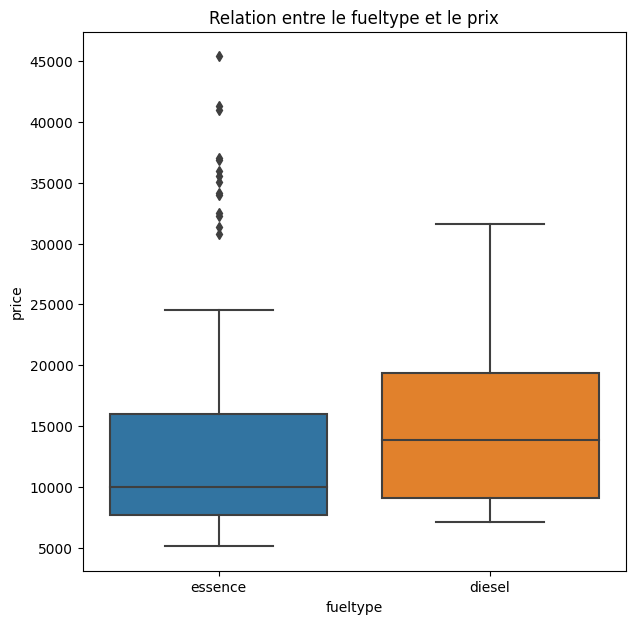

In [185]:
f, ax = plt.subplots()
f.set_size_inches(7,7)
sns.boxplot(data=df_voitures, x='fueltype', y='price',ax=ax)
ax.set_xlabel('fueltype')
ax.set_ylabel('price')
ax.set_title("Relation entre le fueltype et le prix")
plt.show()

### Prix et aspiration

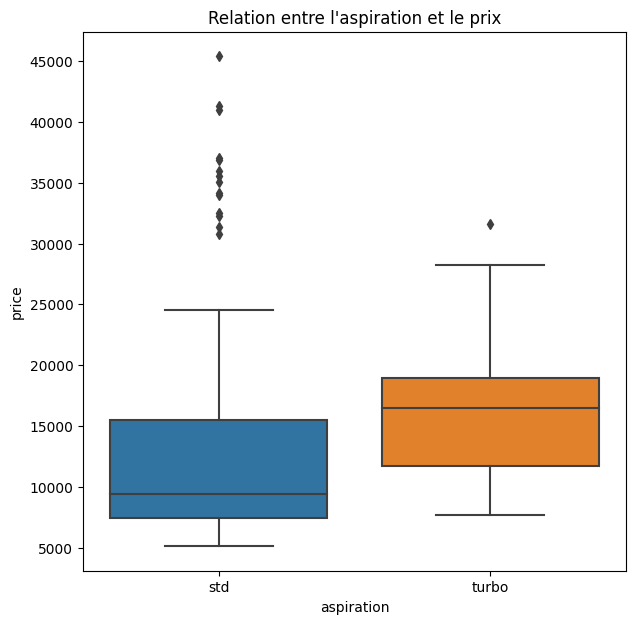

In [186]:
f, ax = plt.subplots()
f.set_size_inches(7,7)
sns.boxplot(data=df_voitures, x='aspiration', y='price',ax=ax)
ax.set_xlabel('aspiration')
ax.set_ylabel('price')
ax.set_title("Relation entre l'aspiration et le prix")
plt.show()

### Prix et carbody

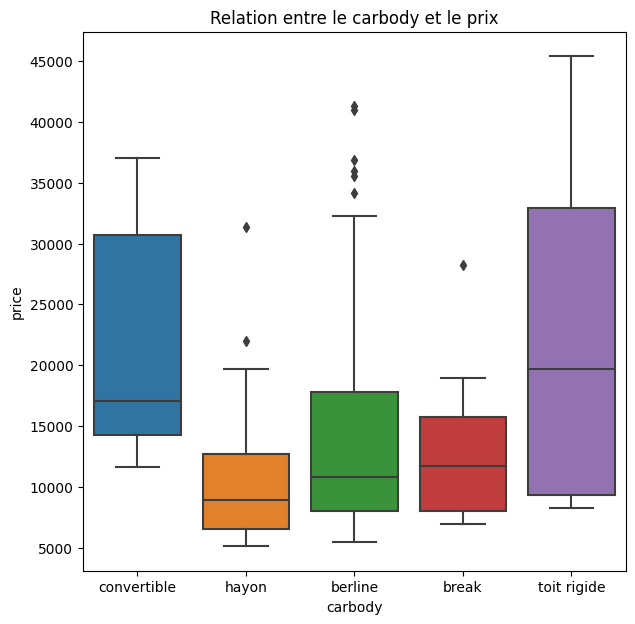

In [187]:
f, ax = plt.subplots()
f.set_size_inches(7,7)
sns.boxplot(data=df_voitures, x='carbody', y='price',ax=ax)
ax.set_xlabel('carbody')
ax.set_ylabel('price')
ax.set_title("Relation entre le carbody et le prix")
plt.show()

### Prix et drivewheel

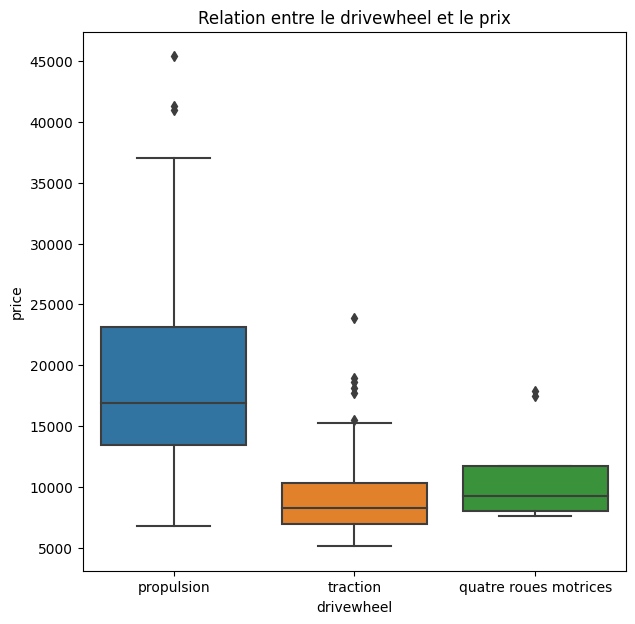

In [188]:
f, ax = plt.subplots()
f.set_size_inches(7,7)
sns.boxplot(data=df_voitures, x='drivewheel', y='price',ax=ax)
ax.set_xlabel('drivewheel')
ax.set_ylabel('price')
ax.set_title("Relation entre le drivewheel et le prix")
plt.show()

### Prix et enginelocation

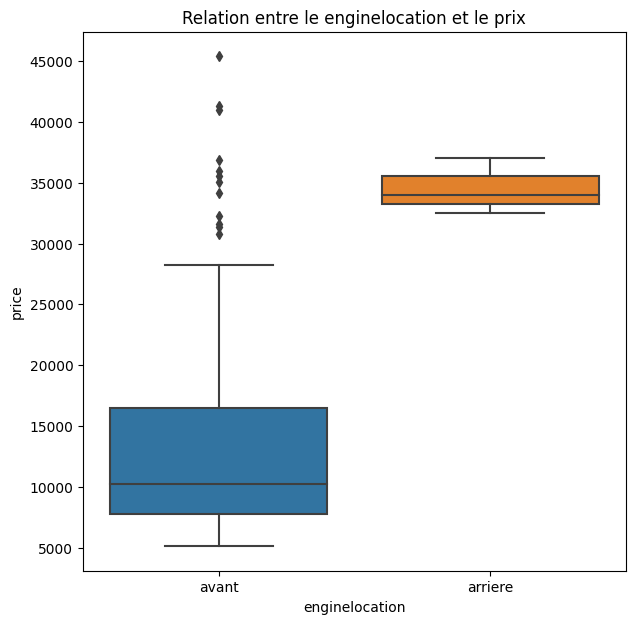

In [189]:
f, ax = plt.subplots()
f.set_size_inches(7,7)
sns.boxplot(data=df_voitures, x='enginelocation', y='price',ax=ax)
ax.set_xlabel('enginelocation')
ax.set_ylabel('price')
ax.set_title("Relation entre le enginelocation et le prix")
plt.show()

### Prix et engine type

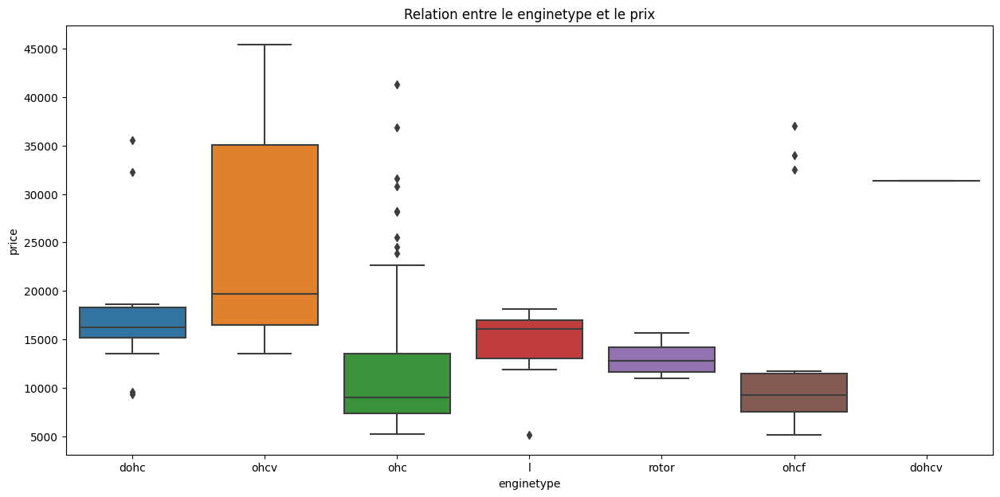

In [190]:
f, ax = plt.subplots()
f.set_size_inches(15,7)
sns.boxplot(data=df_voitures, x='enginetype', y='price',ax=ax)
ax.set_xlabel('enginetype')
ax.set_ylabel('price')
ax.set_title("Relation entre le enginetype et le prix")
plt.show()

### Prix et fuelsystem


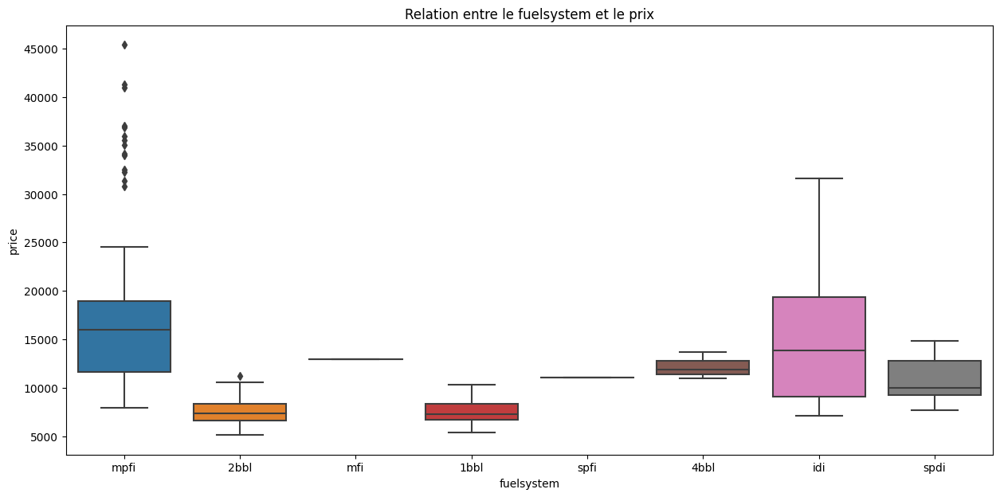

In [191]:
f, ax = plt.subplots()
f.set_size_inches(15,7)
sns.boxplot(data=df_voitures, x='fuelsystem', y='price',ax=ax)
ax.set_xlabel('fuelsystem')
ax.set_ylabel('price')
ax.set_title("Relation entre le fuelsystem et le prix")
plt.show()

### Prix et marque

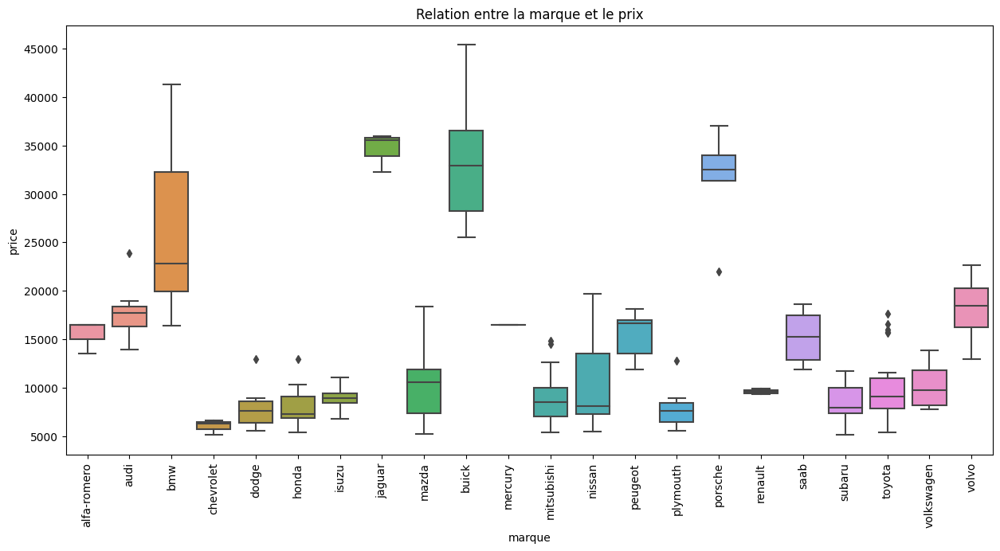

In [192]:
f, ax = plt.subplots()
f.set_size_inches(15,7)
sns.boxplot(data=df_voitures, x='marque', y='price',ax=ax)
ax.set_xlabel('marque')
ax.set_ylabel('price')
ax.set_title("Relation entre la marque et le prix")
ax.set_xticklabels(ax.get_xticklabels(), rotation=90) 
plt.show()